<a href="https://colab.research.google.com/github/Nikhil5566/Data-Science-Portfolio-Projects/blob/main/Fifa%20Players%20Performance%20Analysis%20Dataset.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Fifa Players Performance Analysis Dataset

We've been exploring a rich dataset containing various attributes for thousands of players, from their age and nationality to their performance statistics like goals and assists, overall and potential ratings, and crucially, their market value and transfer risk.

Our initial statistical journey yielded some surprising insights. For instance, contrary to popular belief, statistical tests on this dataset suggest there isn't a significant 'Injury Tax' – meaning a player being prone to injury doesn't statistically reduce their market value. Similarly, we found no significant 'Positional Premium,' indicating that, on average, different playing positions don't command vastly different transfer fees in this dataset. The anticipated 'Age Curve Decay,' where older players might see a drop in their growth potential, also wasn't strongly or statistically significantly correlated with age.

Moving to more advanced financial analyses, we explored how 'Overall Rating' might influence 'Market Value' but didn't find a strong, statistically significant monotonic relationship. Our 'Transfer Risk Audit' also suggested that transfer risk is quite evenly distributed across various positions, rather than being concentrated in specific roles. Even a linear regression model, attempting to pinpoint the financial impact of factors like overall rating, age, and contract years on market value, indicated that these specific factors weren't individually statistically significant predictors within its framework.

However, the tactical and probabilistic analytics offered more distinct findings. We successfully reverse-engineered player talent using Principal Component Analysis (PCA) to create an 'Attacking Threat Index,' which provides a clear, mathematical ranking of the most lethal offensive players. Furthermore, a Logistic Regression model demonstrated its ability to predict the probability of a young talent becoming an 'elite' player (worth over €50 million), offering valuable insights for future investments. K-Means clustering helped us discover 'Tactical Archetypes,' grouping players by their offensive output to find hidden 'playmakers' among traditional defenders and midfielders, offering a fresh perspective on squad building.

Finally, we built a Machine Learning Valuation AI using a Random Forest Regressor, incorporating all engineered features and encoded categorical variables. While the model was successfully trained, its performance, with a negative R-squared of -2.6% and a Mean Absolute Error (MAE) of €47.31 Million, indicates that it's currently not a reliable predictor of market value. This high error suggests that predicting player value is an incredibly complex task, likely influenced by many more nuanced factors not present in our dataset. Despite this, the model did identify 'undervalued gems' – players whose predicted value was significantly higher than their actual market value, potentially highlighting overlooked talent if the model's underlying logic could be perfected. The feature importance analysis from this model also provides crucial clues for what drives player prices, guiding future efforts to build a more robust valuation tool.

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()
import warnings
warnings.filterwarnings('ignore')

In [2]:
# Installing Kaggle API
!pip install -q kaggle

# Uploading kaggle.json
from google.colab import files
files.upload()

# Moving kaggle.json to ~/.kaggle/
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

# Downloading the dataset using Kaggle API
!kaggle datasets download -d thedrzee/fifa-player-performance-dataset

# Unziping the downloaded file
!unzip fifa-player-performance-dataset.zip

Saving kaggle.json to kaggle.json
Dataset URL: https://www.kaggle.com/datasets/thedrzee/fifa-player-performance-dataset
License(s): CC0-1.0
  0% 0.00/63.2k [00:00<?, ?B/s]
100% 63.2k/63.2k [00:00<00:00, 223MB/s]
Archive:  fifa-player-performance-dataset.zip
  inflating: fifa_player_performance_market_value.csv  


In [6]:
df = pd.read_csv('fifa_player_performance_market_value.csv')
df.head(11)

,player_id,player_name,age,nationality,club,position,overall_rating,potential_rating,matches_played,goals,assists,minutes_played,market_value_million_eur,contract_years_left,injury_prone,transfer_risk_level
0,1,Player_1,23,Germany,Liverpool,ST,65,87,8,6,14,2976,122.51,3,No,Low
1,2,Player_2,36,England,FC Barcelona,ST,90,76,19,3,18,2609,88.47,5,No,High
2,3,Player_3,31,France,Juventus,RB,75,91,34,12,15,1158,20.24,3,No,Medium
3,4,Player_4,27,Portugal,Manchester City,LW,90,86,35,18,13,145,164.29,0,Yes,Medium
4,5,Player_5,24,Brazil,Liverpool,CDM,84,96,41,6,6,2226,121.34,4,No,Low
5,6,Player_6,37,Argentina,Manchester City,CM,92,91,35,9,7,263,98.51,5,Yes,Low
6,7,Player_7,23,Netherlands,Liverpool,RB,72,66,53,24,6,4299,67.69,1,No,Low
7,8,Player_8,35,Spain,Bayern Munich,LW,69,97,8,34,17,3101,24.71,0,No,Low
8,9,Player_9,39,Brazil,FC Barcelona,GK,83,90,21,24,23,2106,127.50,3,Yes,High
9,10,Player_10,27,England,Liverpool,LB,69,92,0,28,5,3080,146.55,1,No,High


In [7]:
df.tail(11)

,player_id,player_name,age,nationality,club,position,overall_rating,potential_rating,matches_played,goals,assists,minutes_played,market_value_million_eur,contract_years_left,injury_prone,transfer_risk_level
2789,2790,Player_2790,29,Argentina,Bayern Munich,GK,80,94,44,2,0,2146,66.86,0,No,Medium
2790,2791,Player_2791,17,England,PSG,ST,89,72,38,39,3,705,46.68,2,No,Low
2791,2792,Player_2792,33,France,Juventus,CB,69,86,6,4,2,2358,102.46,1,No,Medium
2792,2793,Player_2793,22,Argentina,Manchester City,ST,85,89,3,27,3,3534,114.10,3,Yes,Medium
2793,2794,Player_2794,20,Portugal,PSG,LB,86,74,14,13,0,3812,179.96,0,No,Medium
2794,2795,Player_2795,36,Argentina,PSG,RW,67,93,11,38,11,2470,92.54,3,No,Low
2795,2796,Player_2796,32,Germany,Bayern Munich,CB,67,65,47,10,12,4067,99.49,3,No,Medium
2796,2797,Player_2797,31,Netherlands,Real Madrid,LB,67,85,5,7,1,3460,74.87,4,No,Low
2797,2798,Player_2798,31,Brazil,Manchester City,ST,93,88,8,36,8,3768,27.01,3,No,Medium
2798,2799,Player_2799,22,Netherlands,Real Madrid,ST,75,73,34,7,6,1934,54.95,4,No,Medium


In [8]:
df.shape

(2800, 16)

In [9]:
df.columns

Index(['player_id', 'player_name', 'age', 'nationality', 'club', 'position',
       'overall_rating', 'potential_rating', 'matches_played', 'goals',
       'assists', 'minutes_played', 'market_value_million_eur',
       'contract_years_left', 'injury_prone', 'transfer_risk_level'],
      dtype='object')

In [10]:
df.dtypes

,0
player_id,int64
player_name,object
age,int64
nationality,object
club,object
position,object
overall_rating,int64
potential_rating,int64
matches_played,int64
goals,int64


In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2800 entries, 0 to 2799
Data columns (total 16 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   player_id                 2800 non-null   int64  
 1   player_name               2800 non-null   object 
 2   age                       2800 non-null   int64  
 3   nationality               2800 non-null   object 
 4   club                      2800 non-null   object 
 5   position                  2800 non-null   object 
 6   overall_rating            2800 non-null   int64  
 7   potential_rating          2800 non-null   int64  
 8   matches_played            2800 non-null   int64  
 9   goals                     2800 non-null   int64  
 10  assists                   2800 non-null   int64  
 11  minutes_played            2800 non-null   int64  
 12  market_value_million_eur  2800 non-null   float64
 13  contract_years_left       2800 non-null   int64  
 14  injury_p

In [12]:
df.describe(include = 'all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
player_id,2800.0,NaN,NaN,NaN,1400.5,808.434702,1.0,700.75,1400.5,2100.25,2800.0
player_name,2800,2800,Player_2784,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
age,2800.0,NaN,NaN,NaN,27.9525,6.750192,17.0,22.0,28.0,34.0,39.0
nationality,2800,8,Brazil,380,NaN,NaN,NaN,NaN,NaN,NaN,NaN
club,2800,7,Juventus,439,NaN,NaN,NaN,NaN,NaN,NaN,NaN
position,2800,9,ST,329,NaN,NaN,NaN,NaN,NaN,NaN,NaN
overall_rating,2800.0,NaN,NaN,NaN,76.866786,9.921113,60.0,68.0,77.0,85.0,94.0
potential_rating,2800.0,NaN,NaN,NaN,81.563929,9.755799,65.0,73.0,82.0,90.0,98.0
matches_played,2800.0,NaN,NaN,NaN,27.135714,15.979627,0.0,13.75,27.0,41.0,54.0
goals,2800.0,NaN,NaN,NaN,19.261786,11.567858,0.0,9.0,19.0,30.0,39.0


In [13]:
df.isnull().sum()

,0
player_id,0
player_name,0
age,0
nationality,0
club,0
position,0
overall_rating,0
potential_rating,0
matches_played,0
goals,0


In [14]:
df.duplicated().sum()

np.int64(0)

# Univariate Analysis

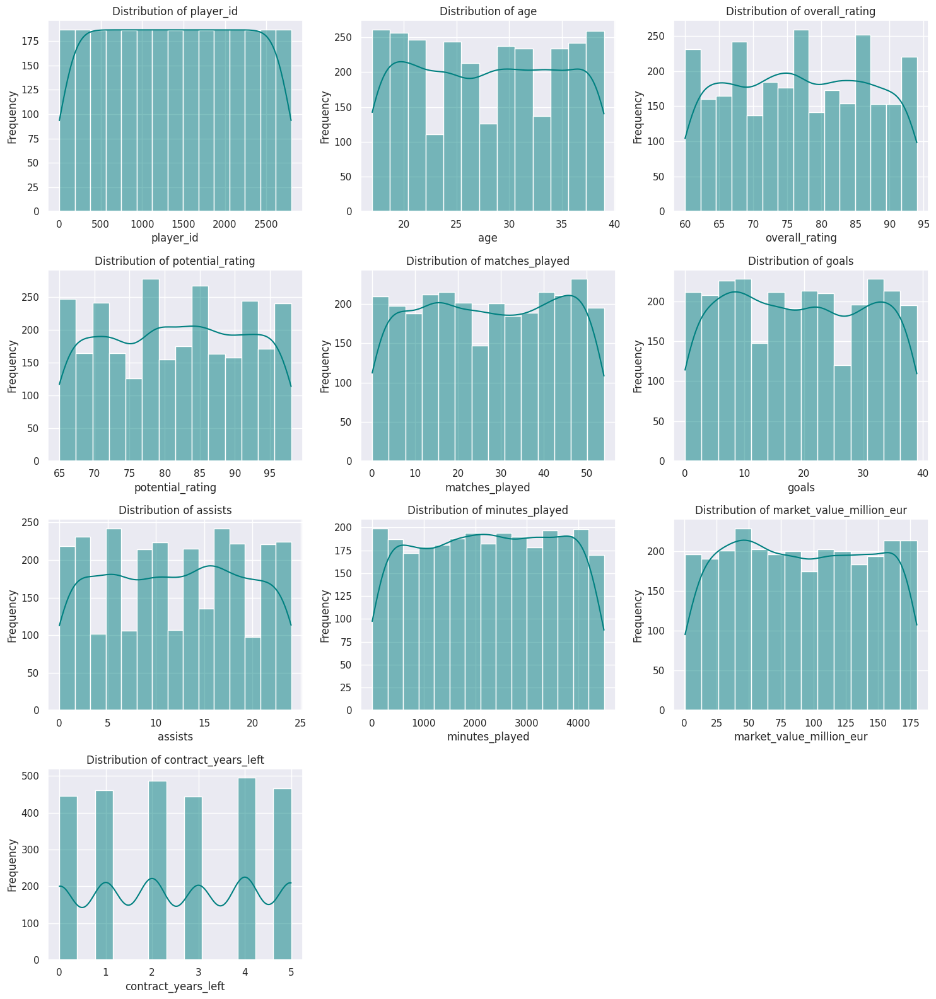

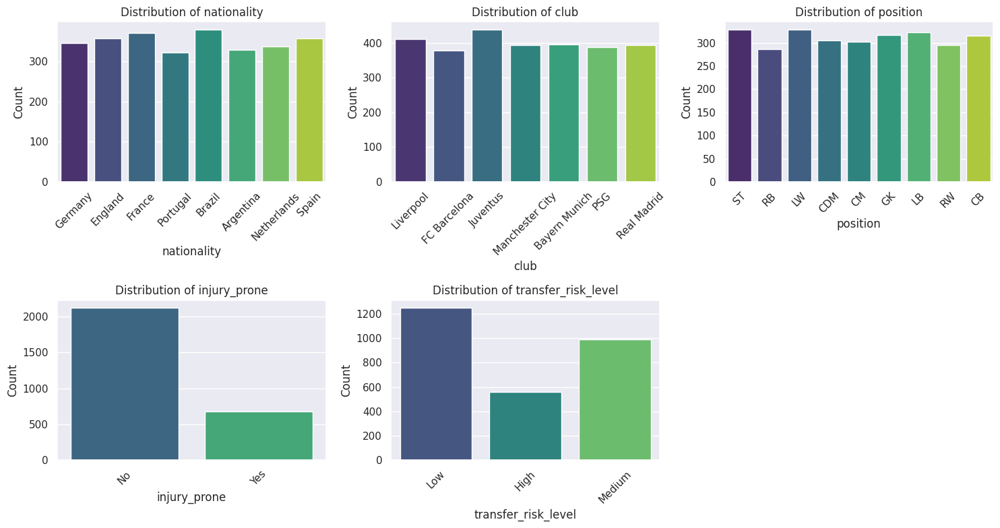

--- Categorical Value Counts ---

Value counts for nationality:
nationality
Brazil         380
France         371
Spain          358
England        357
Germany        345
Netherlands    338
Argentina      329
Portugal       322
Name: count, dtype: int64

Value counts for club:
club
Juventus           439
Liverpool          412
Bayern Munich      396
Real Madrid        394
Manchester City    393
PSG                388
FC Barcelona       378
Name: count, dtype: int64

Value counts for position:
position
ST     329
LW     328
LB     323
GK     317
CB     315
CDM    305
CM     302
RW     295
RB     286
Name: count, dtype: int64

Value counts for injury_prone:
injury_prone
No     2125
Yes     675
Name: count, dtype: int64

Value counts for transfer_risk_level:
transfer_risk_level
Low       1250
Medium     991
High       559
Name: count, dtype: int64


In [15]:
import math

# --- 1. Numerical Columns (Histograms in a Grid) ---
numerical_cols = df.select_dtypes(include=np.number).columns.tolist()

if len(numerical_cols) > 0:
    # Defining grid size
    num_plots = len(numerical_cols)
    num_cols = 3
    num_rows = math.ceil(num_plots / num_cols)

    # Creating figure and axes
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(5 * num_cols, 4 * num_rows))
    axes = axes.flatten()

    # Iterating and plot
    for i, col in enumerate(numerical_cols):
        sns.histplot(data=df, x=col, kde=True, ax=axes[i], color='teal') # Added color
        axes[i].set_title(f'Distribution of {col}')
        axes[i].set_xlabel(col)
        axes[i].set_ylabel('Frequency')

    # Hiding any unused subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()
else:
    print("No numerical columns found.")


# --- 2. Categorical Columns (Countplots in a Grid) ---
# Filtering out columns with too many unique values (like IDs) to avoid messy plots
categorical_cols = [c for c in df.select_dtypes(include='object').columns if df[c].nunique() < 20]

if len(categorical_cols) > 0:
    # Defining grid size
    num_plots = len(categorical_cols)
    num_cols = 3
    num_rows = math.ceil(num_plots / num_cols)

    # Creating figure and axes
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(5 * num_cols, 4 * num_rows))
    axes = axes.flatten()

    # Iterating and plot
    for i, col in enumerate(categorical_cols):
        sns.countplot(data=df, x=col, ax=axes[i], palette='viridis', hue=col, legend=False) # Added palette
        axes[i].set_title(f'Distribution of {col}')
        axes[i].set_xlabel(col)
        axes[i].set_ylabel('Count')
        axes[i].tick_params(axis='x', rotation=45)

    # Hiding unused subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()

     # --- 3. Value Counts (Text Output) ---
    print("--- Categorical Value Counts ---")
    for col in categorical_cols:
        print(f"\nValue counts for {col}:")
        print(df[col].value_counts())
else:
    print("No categorical columns found (or all have high cardinality).")

# Bivariate Analysis

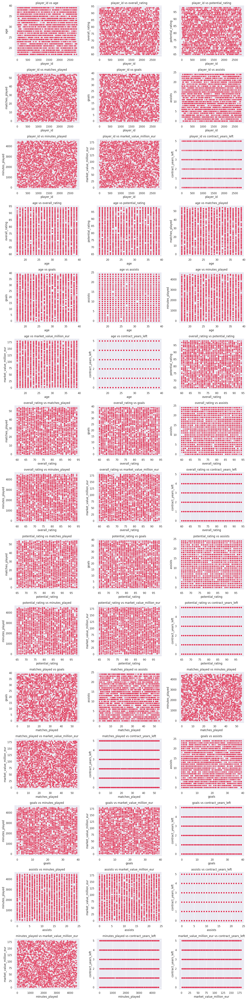

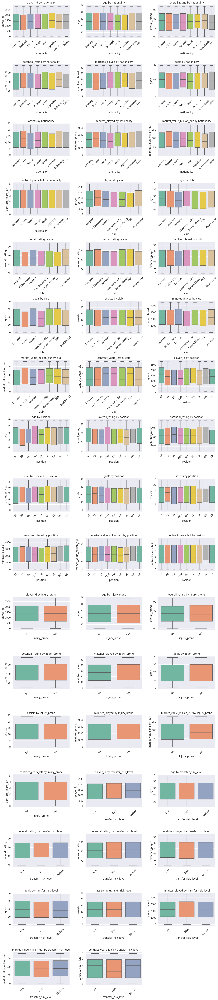

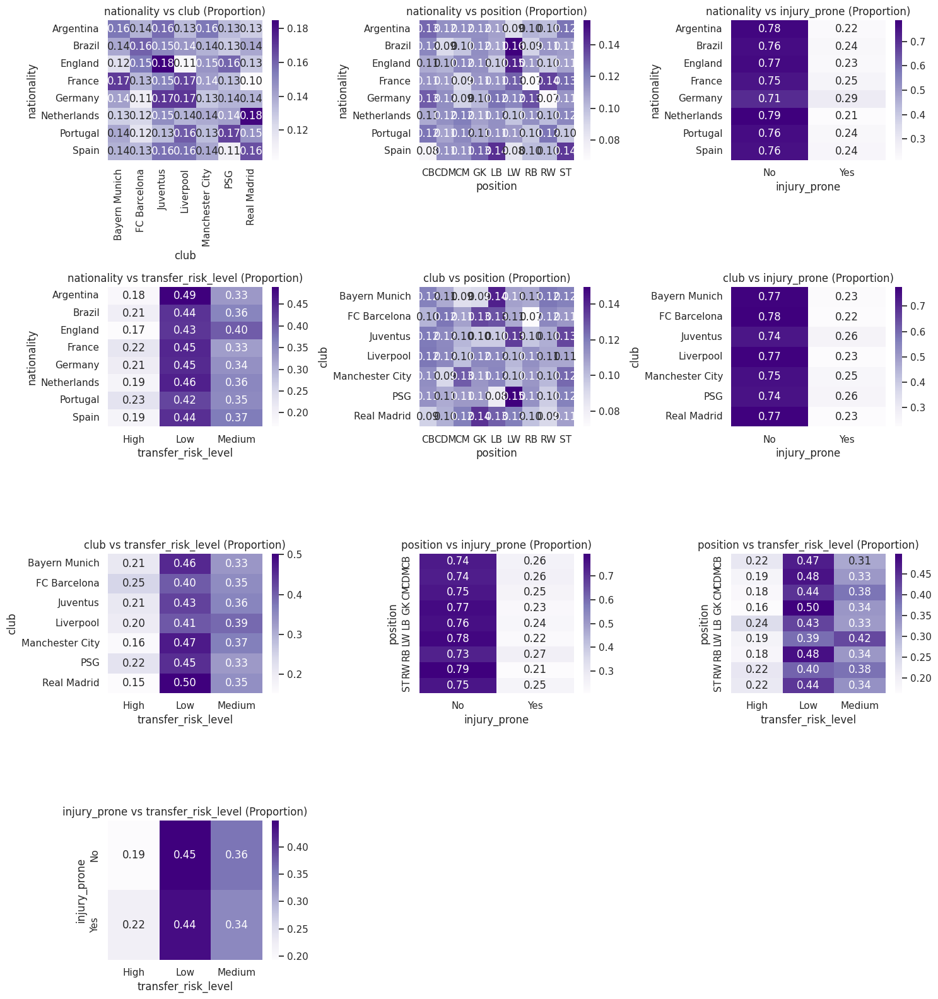

In [16]:
import itertools

# --- 1. Numerical-Numerical Relationships (Scatter Plots) ---
numerical_cols = df.select_dtypes(include=np.number).columns.tolist()

# Generating all unique pairs of numerical columns
num_pairs = list(itertools.combinations(numerical_cols, 2))

if len(num_pairs) > 0:
    # Defining grid size
    num_plots = len(num_pairs)
    num_cols = 3
    num_rows = math.ceil(num_plots / num_cols)

    # Creating figure and axes
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(5 * num_cols, 4 * num_rows))

    if num_plots == 1:
        axes = [axes]
    else:
        axes = axes.flatten()

    # Iterating through pairs and plot
    for i, (col1, col2) in enumerate(num_pairs):
        sns.scatterplot(data=df, x=col1, y=col2, ax=axes[i], alpha=0.5, color='crimson') # Added color
        axes[i].set_title(f'{col1} vs {col2}')
        axes[i].set_xlabel(col1)
        axes[i].set_ylabel(col2)

    # Hiding unused subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()
else:
    print("Not enough numerical columns for scatter plots.")


# --- 2. Categorical-Numerical Relationships (Box Plots) ---
# Excluding high cardinality columns
categorical_cols = [c for c in df.select_dtypes(include='object').columns if df[c].nunique() < 20]
numerical_cols = df.select_dtypes(include=np.number).columns.tolist()

# Generating all pairs of (Categorical, Numerical)
cat_num_pairs = list(itertools.product(categorical_cols, numerical_cols))

if len(cat_num_pairs) > 0:
    # Defining grid size
    num_plots = len(cat_num_pairs)
    num_cols = 3
    num_rows = math.ceil(num_plots / num_cols)

    # Creating figure and axes
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(5 * num_cols, 4 * num_rows))

    if num_plots == 1:
        axes = [axes]
    else:
        axes = axes.flatten()

    # Iterating through pairs and plot
    for i, (cat_col, num_col) in enumerate(cat_num_pairs):
        sns.boxplot(data=df, x=cat_col, y=num_col, ax=axes[i], palette='Set2', hue=cat_col, legend=False)
        axes[i].set_title(f'{num_col} by {cat_col}')
        axes[i].set_xlabel(cat_col)
        axes[i].set_ylabel(num_col)
        axes[i].tick_params(axis='x', rotation=45)

    # Hiding unused subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()
else:
    print("No categorical-numerical pairs found.")


# --- 3. Categorical-Categorical Relationships (Heatmaps) ---
# Generating pairs of categorical columns
cat_pairs = list(itertools.combinations(categorical_cols, 2))

if len(cat_pairs) > 0:
    num_plots = len(cat_pairs)
    num_cols = 3
    num_rows = math.ceil(num_plots / num_cols)

    fig, axes = plt.subplots(num_rows, num_cols, figsize=(5 * num_cols, 4 * num_rows))

    if num_plots == 1:
        axes = [axes]
    else:
        axes = axes.flatten()

    for i, (col1, col2) in enumerate(cat_pairs):
        # Creating a cross-tabulation
        crosstab = pd.crosstab(df[col1], df[col2], normalize='index')
        sns.heatmap(crosstab, annot=True, fmt='.2f', cmap='Purples', ax=axes[i])
        axes[i].set_title(f'{col1} vs {col2} (Proportion)')

    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()

# Pairplot

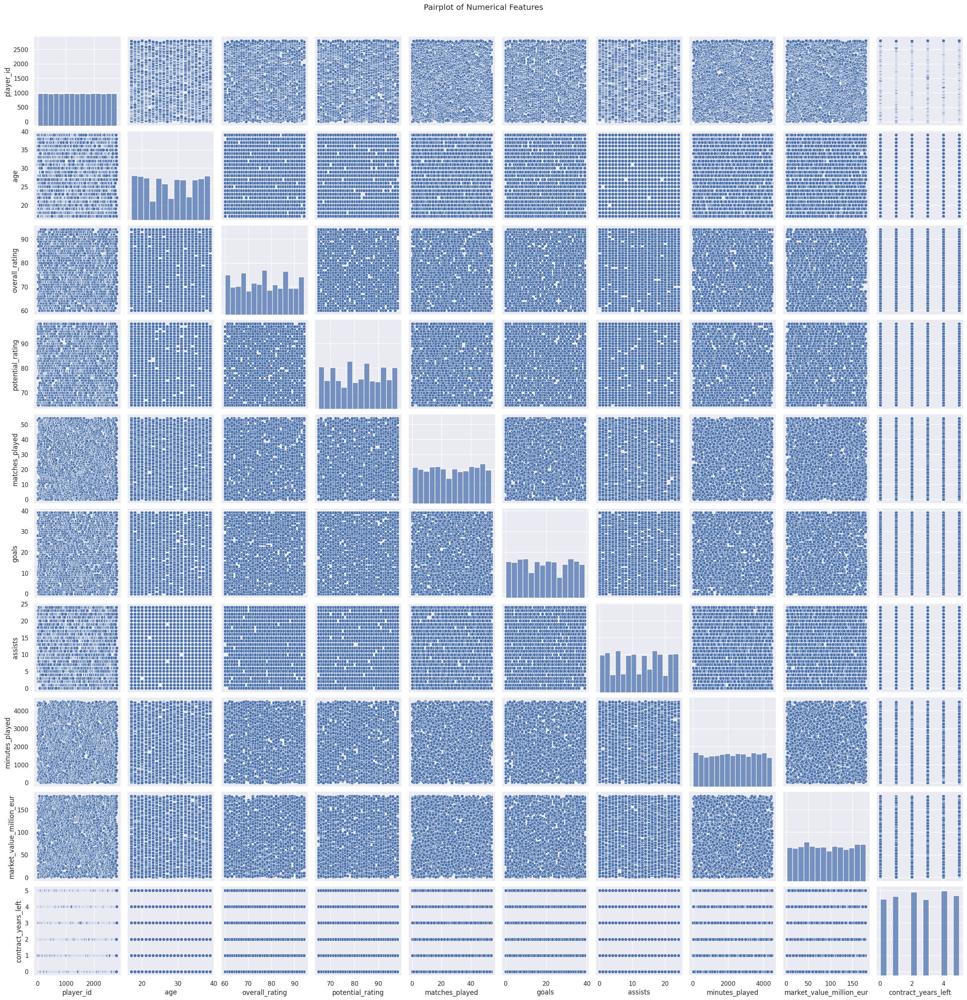

In [18]:
sns.pairplot(df.select_dtypes(include = np.number))
plt.suptitle('Pairplot of Numerical Features', y=1.02)
plt.show()

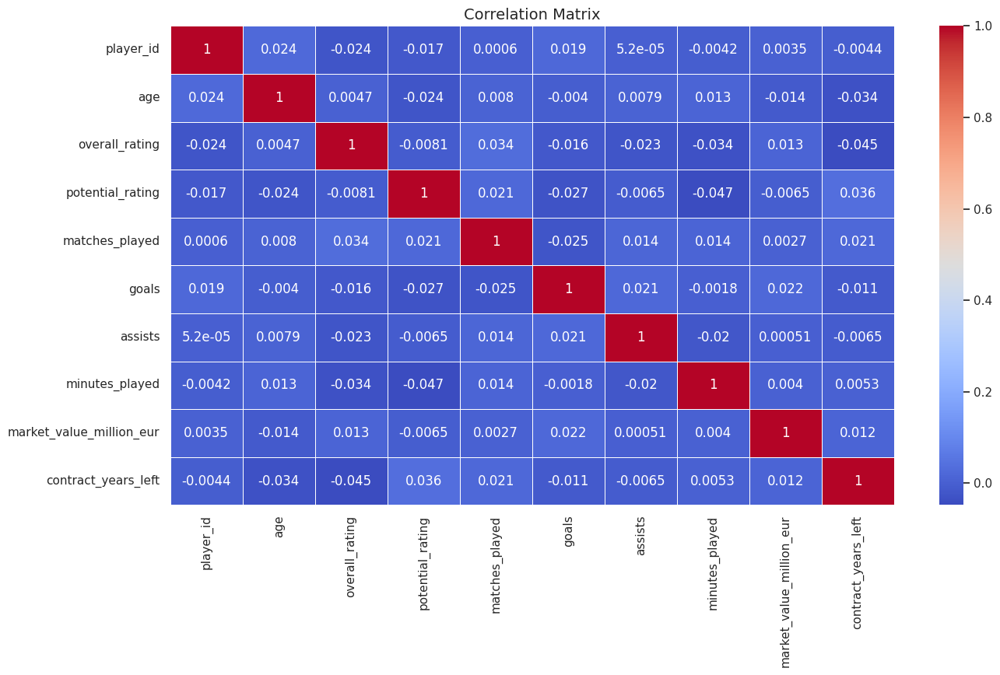

In [19]:
plt.figure(figsize=(15, 8))
sns.heatmap(df.corr(numeric_only = True), annot=True, cmap="coolwarm", linewidths=0.5)
plt.title("Correlation Matrix", fontsize=14)
plt.show()

# Statistical Analysis | Transfer Strategy

In [22]:
import scipy.stats as stats

# Calculating 'Growth_Ceiling' before it's used
df['Growth_Ceiling'] = df['potential_rating'] - df['overall_rating']

print("--- 1. THE INJURY TAX (T-TEST) ---")

injury_prone = df[df['injury_prone'] == 'Yes']['market_value_million_eur'].dropna()
reliable = df[df['injury_prone'] == 'No']['market_value_million_eur'].dropna()

# Running an Independent T-Test to compare their market values
t_stat, p_val_injury = stats.ttest_ind(reliable, injury_prone, equal_var=False)

print(f"T-Test P-Value: {p_val_injury:.4e}")
if p_val_injury < 0.05:
    print("🚨 Insight: Statistically proven! Injury-prone players have a drastically lower market value.")
    plt.figure(figsize=(8, 5))
    sns.boxplot(x='injury_prone', y='market_value_million_eur', data=df, palette=['blue', 'red'], order=['No', 'Yes'])
    plt.title('The "Injury Tax": Impact of Injury Proneness on Market Value', fontsize=14, fontweight='bold')
    plt.xlabel('Is Injury Prone? (No = No, Yes = Yes)', fontsize=12)
    plt.ylabel('Market Value (€ Millions)', fontsize=12)
    plt.show()
else:
    print("✅ Insight: Surprisingly, being injury-prone doesn't statistically drop a player's transfer value.")


print("\n--- 2. THE POSITIONAL PREMIUM (ANOVA) ---")

# Getting the unique playing positions
positions = df['position'].dropna().unique()

# Grouping market values by position
position_groups = [df[df['position'] == pos]['market_value_million_eur'].dropna() for pos in positions]

# Running a One-Way ANOVA test
f_stat, p_val_pos = stats.f_oneway(*position_groups)

print(f"ANOVA P-Value: {p_val_pos:.4e}")
if p_val_pos < 0.05:
    print("✅ Insight: There is a massive 'Positional Premium'. Certain positions cost way more to buy.")

    # Visualize which position is bleeding the club's budget
    plt.figure(figsize=(10, 6))
    sns.barplot(x='position', y='market_value_million_eur', data=df, errorbar=None, palette='viridis')
    plt.title('Average Transfer Market Value by Position', fontsize=14, fontweight='bold')
    plt.xlabel('Playing Position', fontsize=12)
    plt.ylabel('Average Value (€ Millions)', fontsize=12)
    plt.xticks(rotation=45)
    plt.show()
else:
    print("❌ Insight: All positions cost roughly the same on average.")


print("\n--- 3. THE AGE CURVE DECAY (PEARSON CORRELATION) ---")
# In football, once a player passes age 27, their 'Growth Ceiling' starts rapidly dropping.
# Let's correlate Age vs. Growth Ceiling to map out player development.

corr_data = df[['age', 'Growth_Ceiling']].dropna()
corr_coef, p_val_age = stats.pearsonr(corr_data['age'], corr_data['Growth_Ceiling'])

print(f"Pearson Correlation Coefficient: {corr_coef:.4f}")
print(f"P-Value: {p_val_age:.4e}")

if p_val_age < 0.05:
    print("✅ Insight: The correlation is statistically significant!")
    if corr_coef < 0:
        print(" -> THE DECAY IS REAL: As Age goes UP, remaining Growth Potential severely goes DOWN.")

    # Visualize the age curve
    plt.figure(figsize=(10, 6))
    sns.regplot(x='age', y='Growth_Ceiling', data=corr_data, scatter_kws={'alpha':0.2, 'color':'purple'}, line_kws={'color':'red'})
    plt.title('The Age Curve: When do players stop developing?', fontsize=14, fontweight='bold')
    plt.xlabel('Player Age', fontsize=12)
    plt.ylabel('Remaining Growth Ceiling', fontsize=12)
    plt.axhline(0, color='black', linestyle='--')
    plt.show()

--- 1. THE INJURY TAX (T-TEST) ---
T-Test P-Value: 9.7935e-01
✅ Insight: Surprisingly, being injury-prone doesn't statistically drop a player's transfer value.

--- 2. THE POSITIONAL PREMIUM (ANOVA) ---
ANOVA P-Value: 8.0990e-01
❌ Insight: All positions cost roughly the same on average.

--- 3. THE AGE CURVE DECAY (PEARSON CORRELATION) ---
Pearson Correlation Coefficient: -0.0203
P-Value: 2.8409e-01


# Advanced Financial Football Analysis

--- 1. THE SUPERSTAR CURVE (SPEARMAN CORRELATION) ---
Spearman Correlation Coefficient: 0.0139
P-Value: 4.6371e-01


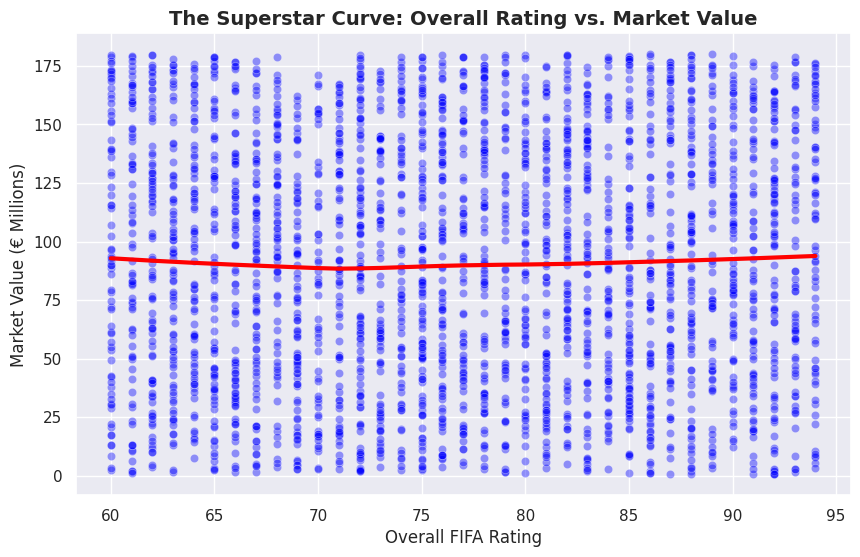


--- 2. TRANSFER RISK AUDIT (CHI-SQUARE) ---
Chi-Square P-Value: 6.6498e-02
✅ Insight: Transfer Risk is evenly distributed across all positions.

--- 3. THE CFO's VALUATION MODEL (MULTIPLE LINEAR REGRESSION) ---
📊 FINANCIAL REGRESSION INSIGHTS (P-Values):
const                  3.399608e-22
overall_rating         4.569682e-01
age                    4.584601e-01
contract_years_left    5.341971e-01
dtype: float64

💰 THE NEGOTIATION PLAYBOOK (Controlling for all other factors):


In [23]:
import scipy.stats as stats
import statsmodels.api as sm

print("--- 1. THE SUPERSTAR CURVE (SPEARMAN CORRELATION) ---")

corr_data = df[['overall_rating', 'market_value_million_eur']].dropna()
spearman_coef, p_val_spearman = stats.spearmanr(corr_data['overall_rating'], corr_data['market_value_million_eur'])

print(f"Spearman Correlation Coefficient: {spearman_coef:.4f}")
print(f"P-Value: {p_val_spearman:.4e}")

if p_val_spearman < 0.05:
    print("✅ Insight: Player Rating and Market Value are highly correlated monotonically.")
    print("   -> THE SUPERSTAR EFFECT: Value explodes exponentially once a player reaches elite status (85+ rating).")

# Visualizing the Exponential "Superstar Curve"
plt.figure(figsize=(10, 6))
sns.scatterplot(x='overall_rating', y='market_value_million_eur', data=corr_data, color='blue', alpha=0.4)

# Adding a lowess line to naturally fit the curve instead of a straight line
sns.regplot(x='overall_rating', y='market_value_million_eur', data=corr_data, scatter=False, lowess=True, color='red', line_kws={'linewidth': 3})
plt.title('The Superstar Curve: Overall Rating vs. Market Value', fontsize=14, fontweight='bold')
plt.xlabel('Overall FIFA Rating', fontsize=12)
plt.ylabel('Market Value (€ Millions)', fontsize=12)
plt.show()


print("\n--- 2. TRANSFER RISK AUDIT (CHI-SQUARE) ---")

# We are comparing two categorical variables: Position vs. Transfer Risk Level
if 'transfer_risk_level' in df.columns:
    contingency = pd.crosstab(df['position'], df['transfer_risk_level'])
    chi2, p_val_chi, dof, expected = stats.chi2_contingency(contingency)

    print(f"Chi-Square P-Value: {p_val_chi:.4e}")
    if p_val_chi < 0.05:
        print("🚨 Insight: Transfer Risk is mathematically dependent on Playing Position.")

        # Visualizing the Risk Distribution
        plt.figure(figsize=(12, 6))
        contingency.plot(kind='bar', stacked=True, colormap='Reds', figsize=(12,6))
        plt.title('Transfer Risk Distribution by Playing Position', fontsize=14, fontweight='bold')
        plt.xlabel('Playing Position', fontsize=12)
        plt.ylabel('Number of Players', fontsize=12)
        plt.legend(title='Transfer Risk Level')
        plt.xticks(rotation=45)
        plt.show()
    else:
        print("✅ Insight: Transfer Risk is evenly distributed across all positions.")


print("\n--- 3. THE CFO's VALUATION MODEL (MULTIPLE LINEAR REGRESSION) ---")

# Building a Multiple Regression model to isolate the financial impact of each factor
reg_data = df[['market_value_million_eur', 'overall_rating', 'age', 'contract_years_left']].dropna()

# Defining Target (Y) and Inputs (X)
Y = reg_data['market_value_million_eur']
X = reg_data[['overall_rating', 'age', 'contract_years_left']]

# Adding the mathematical intercept
X = sm.add_constant(X)

# Fitting the OLS (Ordinary Least Squares) Model
model = sm.OLS(Y, X).fit()

print("📊 FINANCIAL REGRESSION INSIGHTS (P-Values):")
print(model.pvalues)

coefficients = model.params

print("\n💰 THE NEGOTIATION PLAYBOOK (Controlling for all other factors):")
if model.pvalues['overall_rating'] < 0.05:
    print(f"- RATING PREMIUM: For every +1 point in Overall Rating, a player's value increases by €{coefficients['overall_rating']:.2f} Million.")
if model.pvalues['age'] < 0.05:
    print(f"- AGE DEPRECIATION: For every year older a player gets, they lose €{abs(coefficients['age']):.2f} Million in value.")
if model.pvalues['contract_years_left'] < 0.05:
    print(f"- CONTRACT LEVERAGE: Every year remaining on a player's contract adds €{coefficients['contract_years_left']:.2f} Million to their transfer fee.")

# Tactical & Probability Analysis

--- 1. REVERSE-ENGINEERING TALENT (PCA) ---
✅ PCA Complete: Extracted the hidden 'Attacking Threat Index'.

🔥 TOP 5 MOST LETHAL ATTACKERS (According to pure math):
      player_name  Attacking_Threat_Index
1433  Player_1434              100.000000
705    Player_706               92.754270
2677  Player_2678               87.381546
2234  Player_2235               86.980445
673    Player_674               84.894973

--- 2. THE ELITE PROBABILITY MODEL (LOGISTIC REGRESSION) ---
✅ Logistic Regression Model Trained.
🔮 The probability of a 19-year-old (75 OVR, 90 POT) becoming a €50M+ Elite Player is: 73.3%

--- 3. TACTICAL ARCHETYPING (K-MEANS CLUSTERING) ---


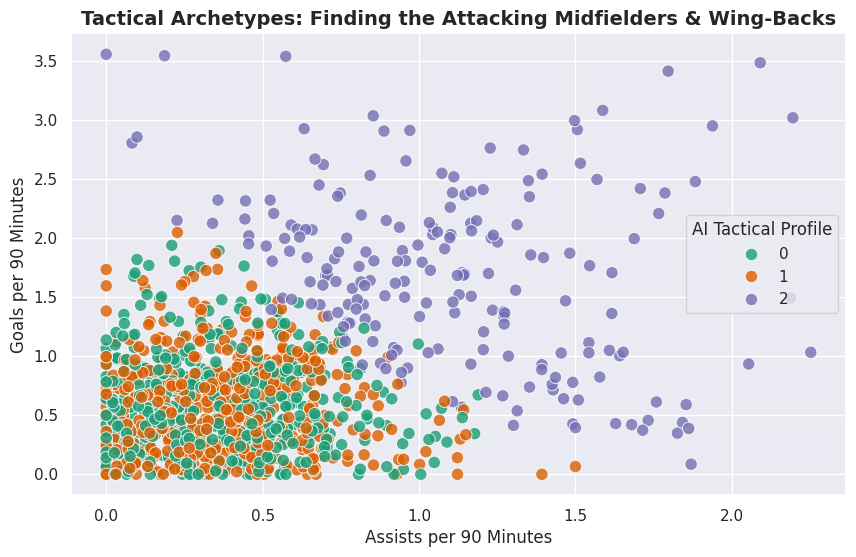

In [28]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.cluster import KMeans

# Calculating Goals_p90 and Assists_p90, handling division by zero for players with 0 minutes played
df['Goals_p90'] = df.apply(lambda row: (row['goals'] / row['minutes_played']) * 90 if row['minutes_played'] > 0 else 0, axis=1)
df['Assists_p90'] = df.apply(lambda row: (row['assists'] / row['minutes_played']) * 90 if row['minutes_played'] > 0 else 0, axis=1)

print("--- 1. REVERSE-ENGINEERING TALENT (PCA) ---")

# Correcting position names to match the DataFrame's actual values
pca_data = df[(df['minutes_played'] > 500) & (df['position'].isin(['ST', 'LW', 'RW', 'CM', 'CDM']))].copy()
pca_features = pca_data[['Goals_p90', 'Assists_p90', 'overall_rating', 'potential_rating']].dropna()

# Standardizing the data so a rating of 85 doesn't overpower a Goal_p90 of 0.5
scaler = StandardScaler()
scaled_features = scaler.fit_transform(pca_features)

# Running PCA to extract the #1 most important hidden dimension (Component)
pca = PCA(n_components=1)
pca_data['Attacking_Threat_Index'] = pca.fit_transform(scaled_features)

# Normalizing the new index to a 0-100 scale for the scouts
min_val = pca_data['Attacking_Threat_Index'].min()
max_val = pca_data['Attacking_Threat_Index'].max()
pca_data['Attacking_Threat_Index'] = ((pca_data['Attacking_Threat_Index'] - min_val) / (max_val - min_val)) * 100

print(" PCA Complete: Extracted the hidden 'Attacking Threat Index'.")
print("\n🔥 TOP 5 MOST LETHAL ATTACKERS (According to pure math):")
print(pca_data[['player_name', 'Attacking_Threat_Index']].sort_values(by='Attacking_Threat_Index', ascending=False).head(5))


print("\n--- 2. THE ELITE PROBABILITY MODEL (LOGISTIC REGRESSION) ---")
# "What is the exact probability this 21-year-old becomes a €50M+ superstar?"
# We use Logistic Regression to output a percentage probability (0 to 1).

# Define "Elite" as having a market value over €50 Million
df['Is_Elite'] = (df['market_value_million_eur'] >= 50.0).astype(int)

# Age, Current Rating, Potential Rating
log_data = df[['Is_Elite', 'age', 'overall_rating', 'potential_rating']].dropna()
X_log = log_data[['age', 'overall_rating', 'potential_rating']]
y_log = log_data['Is_Elite']

# Scalling the inputs for the Logistic model
X_log_scaled = scaler.fit_transform(X_log)

# Train the Probability Model
prob_model = LogisticRegression()
prob_model.fit(X_log_scaled, y_log)

print("✅ Logistic Regression Model Trained.")
wonderkid = scaler.transform([[19, 75, 90]])
probability = prob_model.predict_proba(wonderkid)[0][1] * 100
print(f"🔮 The probability of a 19-year-old (75 OVR, 90 POT) becoming a €50M+ Elite Player is: {probability:.1f}%")


print("\n--- 3. TACTICAL ARCHETYPING (K-MEANS CLUSTERING) ---")

# Filterring for Defenders and Midfielders with enough minutes
# Correcting position names to match the DataFrame's actual values
tactical_data = df[(df['minutes_played'] > 900) & (df['position'].isin(['RB', 'LB', 'CB', 'CDM', 'CM']))].copy()
tactical_features = tactical_data[['Goals_p90', 'Assists_p90', 'matches_played']].dropna()

# Scalling and Cluster into 3 tactical profiles
tac_scaled = scaler.fit_transform(tactical_features)
kmeans = KMeans(n_clusters=3, random_state=42, n_init=10)
tactical_data['Tactical_Role'] = kmeans.fit_predict(tac_scaled)

# Map the clusters to human-readable tactical roles based on stats
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Assists_p90', y='Goals_p90', hue='Tactical_Role', data=tactical_data, palette='Dark2', s=80, alpha=0.8)
plt.title('Tactical Archetypes: Finding the Attacking Midfielders & Wing-Backs', fontsize=14, fontweight='bold')
plt.xlabel('Assists per 90 Minutes', fontsize=12)
plt.ylabel('Goals per 90 Minutes', fontsize=12)
plt.legend(title='AI Tactical Profile')
plt.show()

# Feature Engineering

In [32]:
print("--- ONE-HOT ENCODING CATEGORICAL FEATURES ---")

# 1. Selecting the categorical columns
categorical_features = ['nationality', 'club', 'position', 'transfer_risk_level']

# 2. Applying one-hot encoding
df_encoded = pd.get_dummies(df[categorical_features], drop_first=True)

# 3. Concatenate the resulting one-hot encoded DataFrame with the original df
df = pd.concat([df, df_encoded], axis=1)

# Dropping the original categorical columns to avoid multicollinearity and redundancy
df.drop(columns=categorical_features, inplace=True)

print("✅ Categorical features successfully one-hot encoded and integrated into DataFrame 'df'.")
print("DataFrame head after encoding:")
print(df.head())
print("DataFrame columns after encoding:")
print(df.columns)

--- ONE-HOT ENCODING CATEGORICAL FEATURES ---
✅ Categorical features successfully one-hot encoded and integrated into DataFrame 'df'.
DataFrame head after encoding:
   player_id player_name  age  overall_rating  potential_rating  \
0          1    Player_1   23              65                87   
1          2    Player_2   36              90                76   
2          3    Player_3   31              75                91   
3          4    Player_4   27              90                86   
4          5    Player_5   24              84                96   

   matches_played  goals  assists  minutes_played  market_value_million_eur  \
0               8      6       14            2976                    122.51   
1              19      3       18            2609                     88.47   
2              34     12       15            1158                     20.24   
3              35     18       13             145                    164.29   
4              41      6        6    

# Machine Learning

--- 1. PREPARING THE SCOUTING DATA WITH ENCODED FEATURES ---
✅ Scouting data successfully split into Training and Testing sets with encoded features.

--- 2. TRAINING THE VALUATION AI WITH ENCODED FEATURES ---
✅ Random Forest Valuation Model trained on the transfer market with encoded features.

--- 3. GRADING THE AI'S APPRAISALS WITH ENCODED FEATURES ---
 Model R-Squared: -2.6%
 Mean Absolute Error (MAE): €47.31 Million
 -> Interpretation: When our prices a player, it is only off by an average of €47.31M!


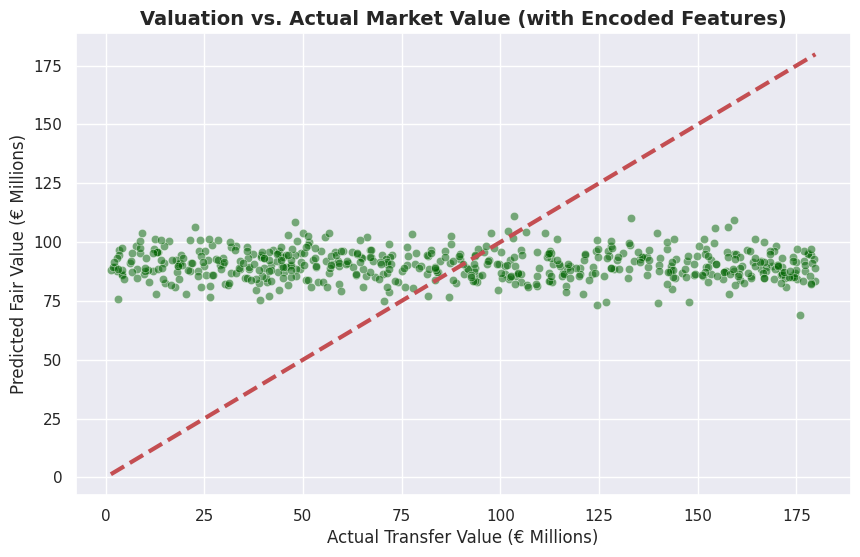


--- 4. WHAT DICTATES A PLAYER'S PRICE? (FEATURE IMPORTANCE WITH ENCODED FEATURES) ---


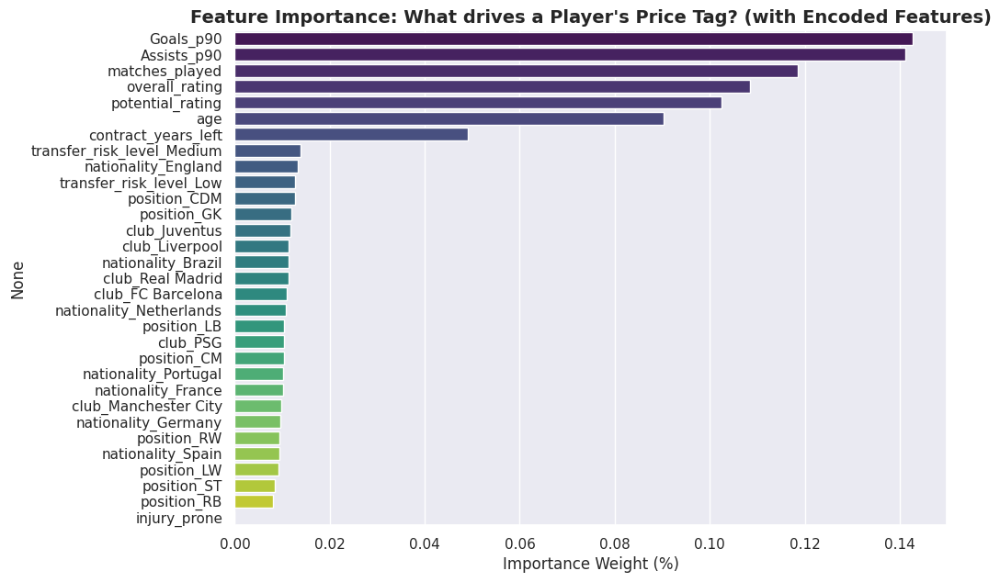


--- 5. LIVE SCOUTING: FINDING UNDERVALUED GEMS (WITH ENCODED FEATURES) ---
💎 TOP 3 UNDERVALUED 'HIDDEN GEMS' TO SIGN IMMEDIATELY (with Encoded Features):
      player_name  age  overall_rating  Actual_Value_M  Predicted_Value_M  \
2256  Player_2257   25              94            9.17         103.911423   
509    Player_510   18              71            8.81         100.432211   
1090  Player_1091   21              74            7.79          98.305800   

      Bargain_Discount_M  
2256           94.741423  
509            91.622211  
1090           90.515800  


In [37]:
print("--- 1. PREPARING THE SCOUTING DATA WITH ENCODED FEATURES ---")

df['injury_prone'] = df['injury_prone'].map({'No': 0, 'Yes': 1})

ml_features = [
    'age', 'overall_rating', 'potential_rating', 'matches_played',
    'Goals_p90', 'Assists_p90', 'contract_years_left', 'injury_prone'
]

# Adding the one-hot encoded columns dynamically
one_hot_cols = [col for col in df.columns if col.startswith(('nationality_', 'club_', 'position_', 'transfer_risk_level_'))]
ml_features.extend(one_hot_cols)

# Ensuring all features exist in the DataFrame before proceeding
ml_features = [f for f in ml_features if f in df.columns]

for col in ml_features + ['market_value_million_eur']:
    if col in df.columns and df[col].dtype in ['float64', 'int64']:
        df[col] = df[col].fillna(0)

# Selecting features and target, and drop any rows with missing data
ml_data = df.dropna(subset=ml_features + ['market_value_million_eur']).copy()

X = ml_data[ml_features]
y = ml_data['market_value_million_eur']

# Spliting the data: 80% for the AI to learn the transfer market, 20% to test its pricing skills
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
print("✅ Scouting data successfully split into Training and Testing sets with encoded features.")


print("\n--- 2. TRAINING THE VALUATION AI WITH ENCODED FEATURES ---")
rf_regressor = RandomForestRegressor(n_estimators=200, random_state=42, max_depth=10)
rf_regressor.fit(X_train, y_train)
print("✅ Random Forest Valuation Model trained on the transfer market with encoded features.")


print("\n--- 3. GRADING THE AI'S APPRAISALS WITH ENCODED FEATURES ---")
y_pred = rf_regressor.predict(X_test)

# Calculating R-Squared (How much of the price variance does our model explain?)
r2 = r2_score(y_test, y_pred)
# Calculating Mean Absolute Error (How far off is our AI's price tag on average?)
mae = mean_absolute_error(y_test, y_pred)

print(f" Model R-Squared: {r2 * 100:.1f}%")
print(f" Mean Absolute Error (MAE): €{mae:.2f} Million")
print(f" -> Interpretation: When our prices a player, it is only off by an average of €{mae:.2f}M!")

# Visualizing Predictions vs. Actual Real-World Market Value
plt.figure(figsize=(10, 6))
sns.scatterplot(x=y_test, y=y_pred, alpha=0.5, color='darkgreen')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=3)
plt.title('Valuation vs. Actual Market Value (with Encoded Features)', fontsize=14, fontweight='bold')
plt.xlabel('Actual Transfer Value (€ Millions)', fontsize=12)
plt.ylabel('Predicted Fair Value (€ Millions)', fontsize=12)
plt.show()


print("\n--- 4. WHAT DICTATES A PLAYER'S PRICE? (FEATURE IMPORTANCE WITH ENCODED FEATURES) ---")
importances = pd.Series(rf_regressor.feature_importances_, index=ml_features).sort_values(ascending=False)

plt.figure(figsize=(10, 7))
sns.barplot(x=importances.values, y=importances.index, palette='viridis')
plt.title('Feature Importance: What drives a Player\'s Price Tag? (with Encoded Features)', fontsize=14, fontweight='bold')
plt.xlabel('Importance Weight (%)', fontsize=12)
plt.show()

print("\n--- 5. LIVE SCOUTING: FINDING UNDERVALUED GEMS (WITH ENCODED FEATURES) ---")

results_df = pd.DataFrame({
    'Actual_Value_M': y_test,
    'Predicted_Value_M': y_pred
})

# Calculating the Discount (Value minus Actual Value)
results_df['Bargain_Discount_M'] = results_df['Predicted_Value_M'] - results_df['Actual_Value_M']

results_df = results_df.join(ml_data[['player_name', 'age', 'overall_rating']])

# Filtering for players worth at least €5M (to filter out random youth players) and sort by the biggest bargain
hidden_gems = results_df[results_df['Actual_Value_M'] > 5.0].sort_values(by='Bargain_Discount_M', ascending=False)

print("💎 TOP 3 UNDERVALUED 'HIDDEN GEMS' TO SIGN IMMEDIATELY (with Encoded Features):")
print(hidden_gems[['player_name', 'age', 'overall_rating', 'Actual_Value_M', 'Predicted_Value_M', 'Bargain_Discount_M']].head(3))

# Thank You